# Auto-immune dataset - Milo differential abundance analysis example

Example workflows for more details:

- [Milopy vignette](https://nbviewer.org/github/emdann/milopy/blob/master/notebooks/milopy_example.ipynb)
- [Extended milo example](https://github.com/Teichlab/scripts/blob/main/conditions/extended_milopy_example.ipynb)

In [1]:
import os,sys
import numpy as np
import pandas as pd
import scanpy as sc


In [2]:
import sys
sys.path.append('/home/jovyan/notebooks_bidossessi/Inflammatory/Remapped/autoimmuneSC/AIID_notebooks/')

from inflapy.immunoFunc import *

In [3]:
print(sc.__version__)

1.9.1


In [4]:
import milopy.core as milo
import milopy

import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

In [5]:
import warnings
warnings.filterwarnings("ignore")

import matplotlib.pyplot as plt
import seaborn as sns
import random
import sc_toolbox

import rpy2.rinterface_lib.callbacks
import anndata2ri
import logging

from rpy2.robjects import pandas2ri
from rpy2.robjects import r

sc.settings.verbosity = 0
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

pandas2ri.activate()
anndata2ri.activate()

%load_ext rpy2.ipython

### Load integrated dataset

In [6]:
dir_save="/nfs/team205/bh14/Datasets/Remapped/raw_adata/SCVI_Results/All_Tissue_or_Nonimmune/Subset/scANVI_T_cells_out/"


In [7]:
adata = sc.read_h5ad(dir_save+"T_cell_from_Tissue_scANVI.h5ad")

In [8]:
adata.shape

(134188, 18033)

In [19]:
#sc.pp.neighbors(adata, n_pcs=30, n_neighbors=60, use_rep="X_scANVI", key_added="scvi_neighbors")


In [20]:
#sc.tl.umap(adata, min_dist=0.7, neighbors_key='scvi_neighbors', spread=2)

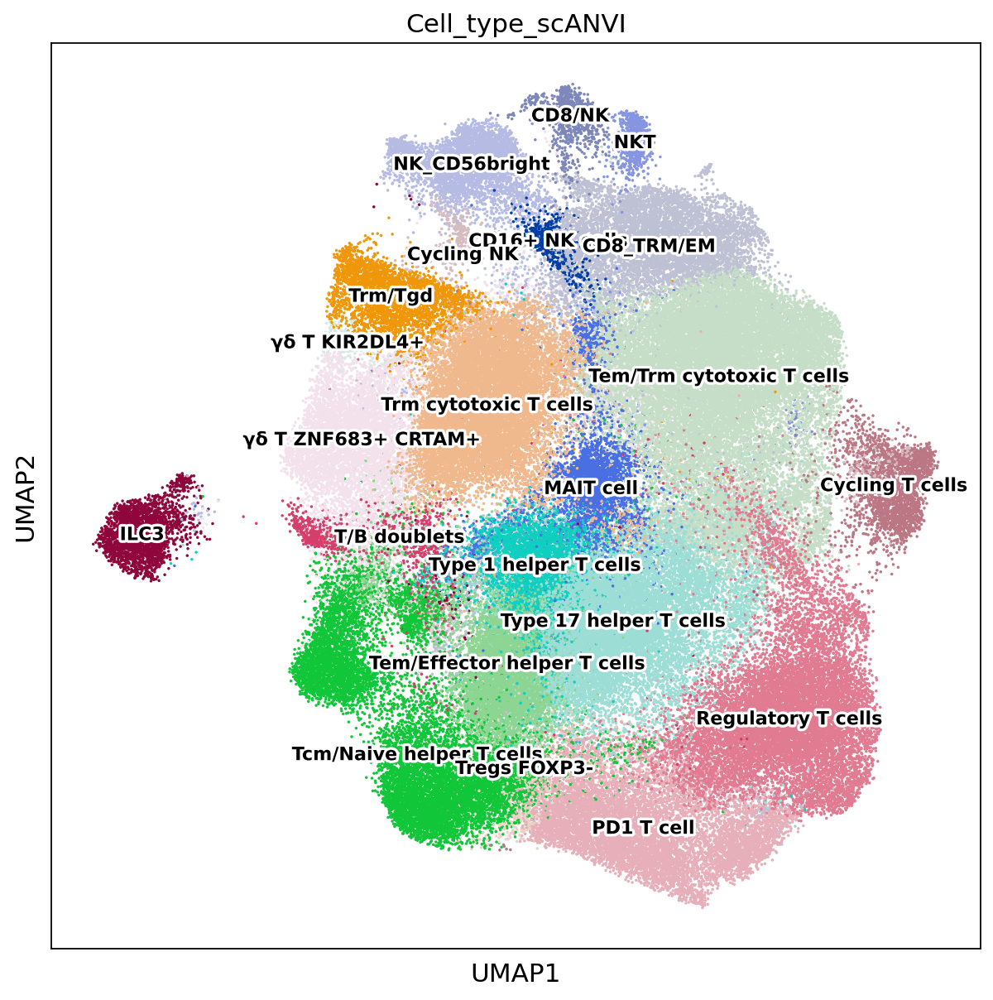

In [10]:
sc.set_figure_params(figsize=(9,9))
sc.pl.umap(
    adata,
    color=["Cell_type_scANVI"],
    ncols=2,
    frameon=True,
    size=10,
    legend_fontoutline=3,
    legend_fontsize=10,
    legend_loc="on data",
    cmap='OrRd'

)

In [23]:
adata.obs[['dataset_id', 'disease']].value_counts(dropna=False)

dataset_id                   disease                   
E-MTAB-9492_Penkava_2020     Psoriatic arthritis           38390
GSE134809_Martin_et_al_2019  Crohn's Disease               15465
Martin_JIA_2019              Oligoarticular JIA            13895
GSE121380_Huang_2019         Paediatric IBD                13159
GSE134809_Martin_et_al_2019  Uninflamed CD                 12947
Qian_Yue_Zhang_2022          Hashimoto’s thyroiditis       11264
Elmentaite_2020              Crohn's Disease                9683
                             Healthy                        6052
E-MTAB-8322_Stefeno_2020     Rheumatoid Arthritis           4507
GSE163314_Lefferts_2021      Crohn's Disease                2067
                             Spondyloarhtritis              2032
                             Healthy                        1309
                             CD + Spondyloarthritis         1008
AMP_phase1_RA                Rheumatoid arthritis            968
GSE161500_Abji_2020          Psori

In [24]:
adata.obs.Cell_type_scANVI = adata.obs.Cell_type_scANVI.astype('category')
adata.obs.disease = adata.obs.disease.astype('category')

We will keep only donors with average 10 cells in each cluster

In [27]:
adata.shape

(134188, 18033)

In [28]:
ncel = len(adata.obs.Cell_type_scANVI.unique())

In [29]:
size_by_donor = adata.obs.groupby(["donor_id"]).size()

In [30]:
donors_to_keep = [
    donor
    for donor in size_by_donor.index
    if size_by_donor[donor] >= 10*ncel
]

In [31]:
len(donors_to_keep)

61

In [32]:
len(adata.obs.donor_id.unique())

105

In [33]:
donors_to_keep

['1505_SF_ERS5040440',
 '1607_SF_ERS5040441',
 '1801_SF_ERS5040442',
 '5028STDY7152012',
 '5028STDY7152013',
 '5028STDY7152016',
 '5028STDY7152017',
 'BX254_ST_ERS5040444',
 'GSM3972009',
 'GSM3972013',
 'GSM3972014',
 'GSM3972015',
 'GSM3972016',
 'GSM3972017',
 'GSM3972018',
 'GSM3972019',
 'GSM3972020',
 'GSM3972021',
 'GSM3972023',
 'GSM3972024',
 'GSM3972025',
 'GSM3972026',
 'GSM3972027',
 'GSM3972028',
 'GSM3972029',
 'GSM3972030',
 'HB1_GSM3433578',
 'HB3-1_GSM3433580',
 'HB3-2_GSM3433581',
 'HT12Thyroid',
 'HT13Thyroid',
 'HT28Thyroid',
 'HT29Thyroid',
 'Patient_2_Colon_GSM4976992',
 'Patient_21_Colon_GSM4977000',
 'Patient_23_Colon_GSM4977002',
 'Patient_27_Colon_GSM4977004',
 'Patient_33_Colon_GSM4977006',
 'PsA-3830_GSM4908803',
 'PsA-22228_GSM4908802',
 'S279_GSM3433583',
 'S280_GSM3433584',
 'SA139_ERS3741159',
 'SA149P_ERS3741175',
 'SA159_ERS3741165',
 'SA168_ERS3741166',
 'SA222_ERS3741172',
 'SA227_ERS3741173',
 'T017_IL_cells_ERS4414959',
 'T019_IL_cells_ERS4414960',

In [34]:
adata = adata[adata.obs["donor_id"].isin(donors_to_keep)]

In [35]:
adata.shape

(131308, 18033)

In [36]:
adata.obs.disease.value_counts()

Psoriatic arthritis           38969
Crohn's Disease               26757
Oligoarticular JIA            13895
Paediatric IBD                13022
Uninflamed CD                 12669
Hashimoto’s thyroiditis       11264
Healthy                        7227
Rheumatoid Arthritis           4218
Spondyloarhtritis              1896
CD + Spondyloarthritis         1008
Undifferentiated Arthritis      383
Name: disease, dtype: int64

In [37]:
#We removed Undifferentiated Arthritis because it size very different(small)
adata = adata[adata.obs.disease!="Undifferentiated Arthritis"].copy()

In [9]:
sample_cols = ['dataset_id', 'donor_id', 'tissue', 'disease', 'cell_source', 'Cell_type_scANVI']
sample_df = adata.obs[sample_cols].groupby(sample_cols).size().reset_index()
sample_df.columns = sample_cols + ['n_cells']
sample_df = sample_df[sample_df['n_cells'] > 0].copy()
sample_df

,dataset_id,donor_id,tissue,disease,cell_source,Cell_type_scANVI,n_cells
591605,E-MTAB-8322_Stefeno_2020,SA139_ERS3741159,Synovial membrane,Rheumatoid Arthritis,macrophage,Cycling NK,2
591606,E-MTAB-8322_Stefeno_2020,SA139_ERS3741159,Synovial membrane,Rheumatoid Arthritis,macrophage,Cycling T cells,137
591610,E-MTAB-8322_Stefeno_2020,SA139_ERS3741159,Synovial membrane,Rheumatoid Arthritis,macrophage,NK_CD56bright,5
591611,E-MTAB-8322_Stefeno_2020,SA139_ERS3741159,Synovial membrane,Rheumatoid Arthritis,macrophage,PD1 T cell,14
591612,E-MTAB-8322_Stefeno_2020,SA139_ERS3741159,Synovial membrane,Rheumatoid Arthritis,macrophage,Regulatory T cells,15
...,...,...,...,...,...,...,...
7108767,Qian_Yue_Zhang_2022,HT29Thyroid,Thyroid,Hashimoto’s thyroiditis,Thyroid,Trm/Tgd,10
7108768,Qian_Yue_Zhang_2022,HT29Thyroid,Thyroid,Hashimoto’s thyroiditis,Thyroid,Type 1 helper T cells,237
7108769,Qian_Yue_Zhang_2022,HT29Thyroid,Thyroid,Hashimoto’s thyroiditis,Thyroid,Type 17 helper T cells,46
7108770,Qian_Yue_Zhang_2022,HT29Thyroid,Thyroid,Hashimoto’s thyroiditis,Thyroid,γδ T KIR2DL4+,18


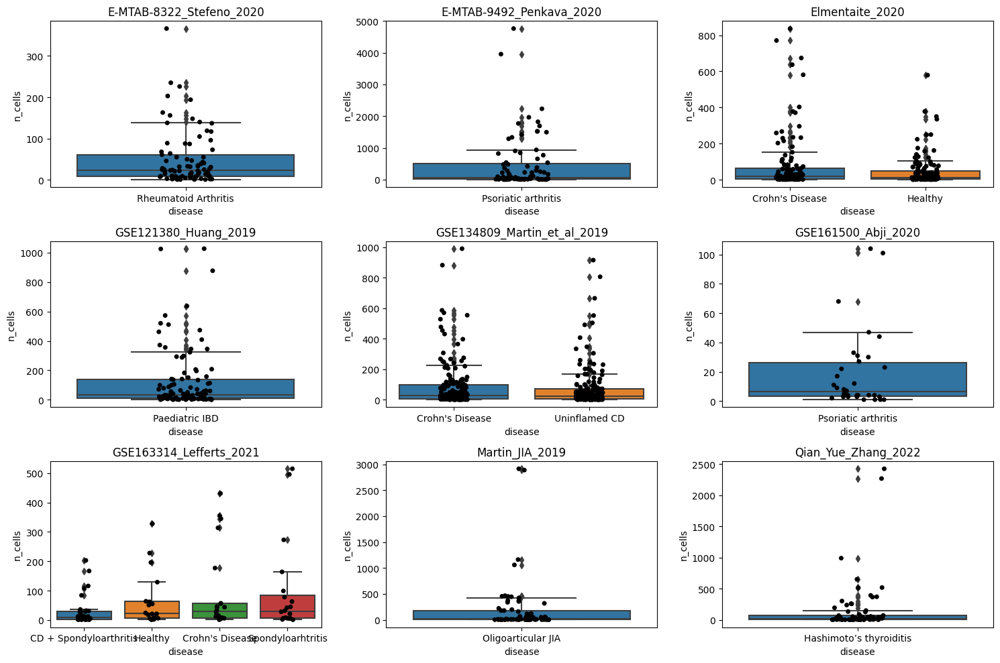

In [11]:
all_datasets = sample_df['dataset_id'].unique()
all_diseases = sample_df['disease'].unique()

with plt.rc_context({'figure.figsize':[15,10]}):
    for i,d in enumerate(all_datasets):
        plt.subplot(3,3,i+1);
        d_df = sample_df[sample_df.dataset_id == d].copy()
        d_df['disease'] = d_df['disease'].astype('str')
        sns.boxplot(
            data = d_df,
            x = 'disease',
            y = 'n_cells'
        );
        sns.stripplot(
            data = d_df,
            x = 'disease',
            y = 'n_cells',
            color = 'black'
        );
        plt.title(d);
    plt.tight_layout()
    plt.show()

Check sample metadata

In [ ]:
all_diseases

In [41]:
sample_df['disease'].value_counts()

Crohn's Disease            318
Uninflamed CD              174
Healthy                    150
Psoriatic arthritis        118
Paediatric IBD             104
Rheumatoid Arthritis        85
Hashimoto’s thyroiditis     75
Oligoarticular JIA          69
CD + Spondyloarthritis      35
Spondyloarhtritis           20
Name: disease, dtype: int64

In [42]:
adata.obs.disease.unique()

['Hashimoto’s thyroiditis', 'Oligoarticular JIA', 'Paediatric IBD', 'Rheumatoid Arthritis', 'Psoriatic arthritis', 'Crohn's Disease', 'Uninflamed CD', 'Healthy', 'CD + Spondyloarthritis', 'Spondyloarhtritis']
Categories (10, object): ['CD + Spondyloarthritis', 'Crohn's Disease', 'Hashimoto’s thyroiditis', 'Healthy', ..., 'Psoriatic arthritis', 'Rheumatoid Arthritis', 'Spondyloarhtritis', 'Uninflamed CD']

In [12]:
## Rename disease (DA code complains because of weird characters in names)
diseases_short = {
    'Psoriatic arthritis':'pso_arthritis',#
    'Rheumatoid Arthritis':'RA',#
    'Undifferentiated Arthritis':'Undif_RA',
    'Paediatric IBD':'Paed_IBD',#
    'CD + Spondyloarthritis':"CD_and_spondoarthritis", #
    'Spondyloarhtritis':"spondoarthritis",#
    "Crohn's Disease":"CD", #
    'Healthy':'Healthy',#
    'Uninflamed CD':'Uninfl_CD',#
    'Hashimoto’s thyroiditis':'hashimoto', #
    'Oligoarticular JIA':'Oligo_JIA',#
    
}
# diseases_short = {v:k for k,v in diseases_short.items()}

In [44]:
adata.obs['disease_short'] = [diseases_short[x] for x in adata.obs['disease']]
# sample_col = 'donor_id'
# condition_col = 'disease'

### Make neighbourhoods

In [45]:
## Make KNN graph for Milo analysis 
k = (sample_df['donor_id'].nunique() * 3) # aim to have 3 cells per donor on avg
sc.pp.neighbors(adata, use_rep='X_scANVI', n_neighbors = k)

In [59]:
milo.make_nhoods(adata, prop=0.1)

In [60]:
len(adata.obs.donor_id.unique())

60

Plot number of cells in neighbourhoods

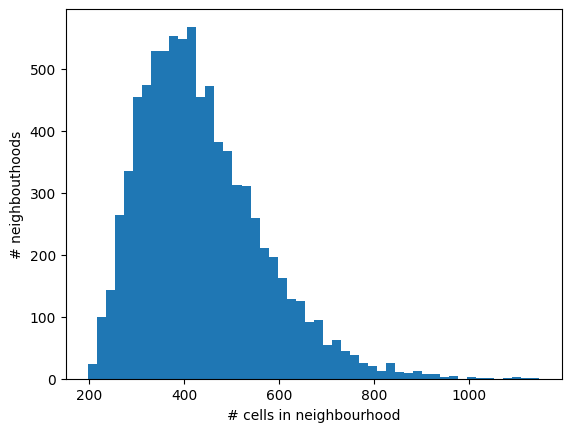

In [61]:
nhood_size = adata.obsm['nhoods'].toarray().sum(0)
plt.hist(nhood_size, bins=50);
plt.xlabel('# cells in neighbourhood');
plt.ylabel('# neighbouthoods');

### Count cells in neighbourhoods

In [49]:
adata.obs['donor_id'] = adata.obs['donor_id'].astype('str') ## Needed for subsetting
milo.count_nhoods(adata, sample_col = 'donor_id')

In [11]:
h5ad_path = '/nfs/team205/bh14/Datasets/Remapped/raw_adata/SCVI_Results/All_Tissue_or_Nonimmune/Subset/Milo/'


#adata.write_h5ad(h5ad_path+'T_From_Tissue_label_transfert_Subset_annotated_Milo_3K.h5ad')

adata = sc.read_h5ad(h5ad_path+'T_From_Tissue_label_transfert_Subset_annotated_Milo_3K.h5ad')

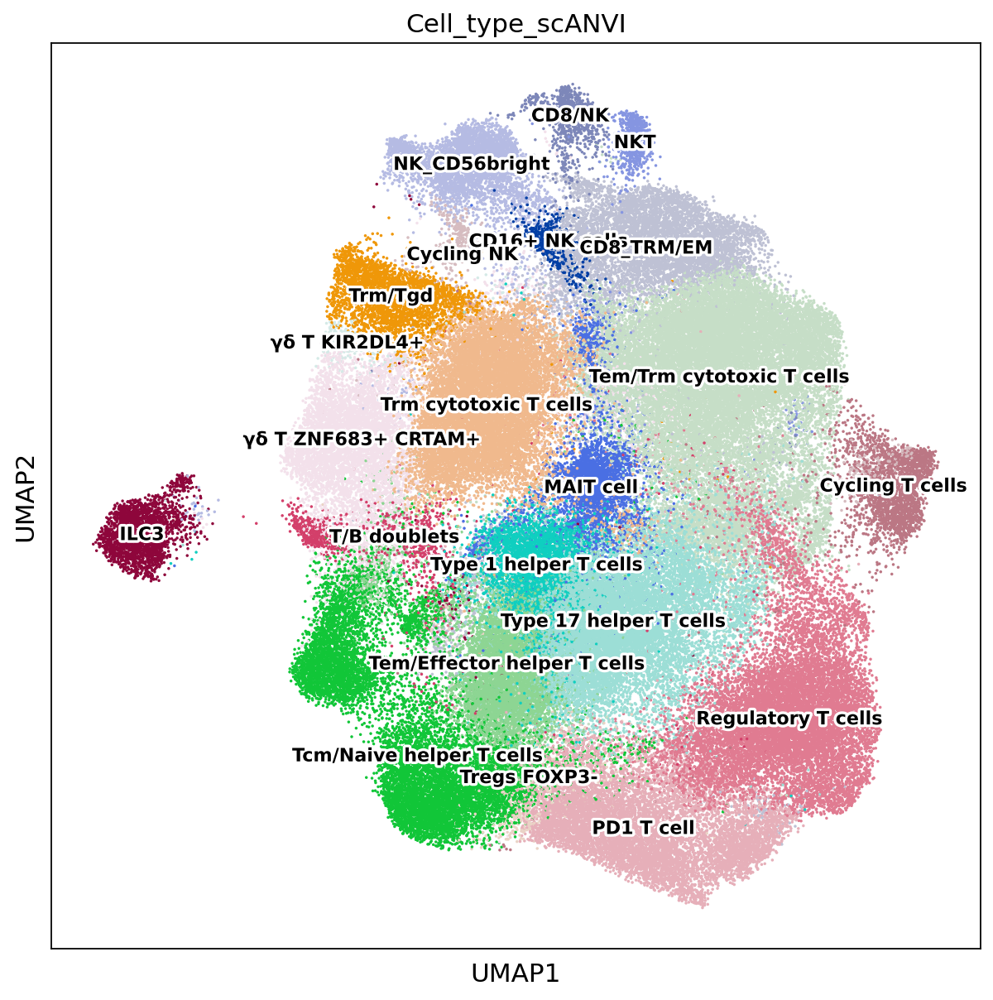

In [13]:
sc.set_figure_params(figsize=(9,9))
sc.pl.umap(
    adata,
    color=["Cell_type_scANVI"],
    ncols=2,
    frameon=True,
    size=10,
    legend_fontoutline=3,
    legend_fontsize=10,
    legend_loc="on data",
    cmap='OrRd'

)

In [13]:
sample_cols = ['dataset_id', 'donor_id', 'tissue', 'disease', 'cell_source', 'Cell_type_scANVI']
sample_df = adata.obs[sample_cols].groupby(sample_cols).size().reset_index()
sample_df.columns = sample_cols + ['n_cells']
sample_df = sample_df[sample_df['n_cells'] > 0].copy()

In [58]:
adata

AnnData object with n_obs × n_vars = 130925 × 18033
    obs: 'tissue', 'disease', 'donor_id', 'dataset_id', 'cell_source', 'doublet_scores', 'predicted_doublets', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'QC', 'sex', 'development_stage', 'batch', 'orig.ident', 'n_genes', 'leiden_1_5', 'predicted_labels', 'majority_voting', 'conf_score', '_scvi_batch', 'cell_type', '_scvi_labels', 'barcodes', 'disease_status', 'age', 'developmental_stage', 'barcode', 'sample_id', 'Site', 'Enrichment', 'Location', 'full_clustering', 'log1p_total_counts', 'author_annotation', 'leiden_man', 'leiden_R', 'cell_type2', 'majority_voting_2', 'leiden', 'Cell_type_scANVI', 'disease_short', 'nhood_ixs_random', 'nhood_ixs_refined', 'nhood_kth_distance'
    var: 'mt-0', 'rb-0', 'n_cells_by_counts-0-0-0', 'mean_counts-0-0-0', 'pct_dropout_by_counts-0-0-0', 'total_counts-0-0-0', 'n_cells_by_counts-1-0-0', 'mean_counts-1-0-0', 'pct_dropout_by_counts-1-

In [15]:
import gc
gc.collect()

34

## Run differential abundance test

### 1. Use paired case-controls

For each test restrict to case-control in the same disease

In [16]:
def plot_milo_diagnostics(milo_res):
    '''Function to plot diagnostic plots 
    as in extended vignette https://github.com/Teichlab/scripts/blob/main/conditions/extended_milopy_example.ipynb
    '''
    nhood_adata = adata.uns['nhood_adata'].copy()
    alpha = 0.1 ## significance threshold

    with matplotlib.rc_context({'figure.figsize':[8,8]}):

        ## Check P-value histogram
        plt.subplot(2,2,1);
        plt.hist(milo_res['PValue'], bins=20);
        plt.xlabel('Uncorrected P-value');

        ## Visualize extent of multiple-testing correction
        plt.subplot(2,2,2);
        plt.scatter(milo_res['PValue'], milo_res['SpatialFDR'], s=3);
        plt.xlabel('Uncorrected P-value');
        plt.ylabel('SpatialFDR');

        ## Visualize volcano plot
        plt.subplot(2,2,3);
        plt.scatter(milo_res['logFC'], -np.log10(milo_res['SpatialFDR']), s=3);
        plt.axhline(y=-np.log10(alpha), color='red', linewidth=1, label=f'{int(alpha*100)} % SpatialFDR');
        plt.legend();
        plt.xlabel('log-Fold Change');
        plt.ylabel('- log10(SpatialFDR)');
        plt.tight_layout()

        ## Visualize MA plot
        df = milo_res
        emp_null = df[df['SpatialFDR'] >= alpha]['logFC'].mean()
        df['Sig'] = df['SpatialFDR'] < alpha

        plt.subplot(2,2,4);
        sns.scatterplot(data=df, x="logCPM", y="logFC", hue='Sig')
        plt.axhline(y=0, color='grey', linewidth=1)
        plt.axhline(y=emp_null, color='purple', linewidth=1);
        plt.legend(title=f'< {int(alpha*100)} % SpatialFDR')
        plt.xlabel('Mean log-counts');
        plt.ylabel('log-Fold Change');
        plt.show()
        
def run_DA_autoimmune(adata, sample_df, DA_test_dict):
    '''Wrapper function to run differential abundance testing on autoimmune dataset
    '''
    
    adata.obs['disease_test'] = np.where(adata.obs['disease'].isin(DA_test_dict['disease']), 1, 0)
    
    test_samples = sample_df['donor_id'][sample_df['dataset_id'] == DA_test_dict['dataset_id']].astype('str').values
    
    milo.DA_nhoods(adata, 
                   design="~ donor_id + disease_test",
                   subset_samples=test_samples.tolist()
                  )
    milo_results = adata.uns["nhood_adata"].obs.copy() ## Store results for each disease
    plot_milo_diagnostics(milo_results.dropna())
    return(milo_results)


In [17]:
np.unique(adata.obs.dataset_id)

array(['E-MTAB-8322_Stefeno_2020', 'E-MTAB-9492_Penkava_2020',
       'Elmentaite_2020', 'GSE121380_Huang_2019',
       'GSE134809_Martin_et_al_2019', 'GSE161500_Abji_2020',
       'GSE163314_Lefferts_2021', 'Martin_JIA_2019',
       'Qian_Yue_Zhang_2022'], dtype=object)

In [18]:
adata.obs[["dataset_id", "disease"]].value_counts().sort_index()

dataset_id                   disease                
E-MTAB-8322_Stefeno_2020     Rheumatoid Arthritis        4218
E-MTAB-9492_Penkava_2020     Psoriatic arthritis        38322
Elmentaite_2020              Crohn's Disease             9580
                             Healthy                     6005
GSE121380_Huang_2019         Paediatric IBD             13022
GSE134809_Martin_et_al_2019  Crohn's Disease            15168
                             Uninflamed CD              12669
GSE161500_Abji_2020          Psoriatic arthritis          647
GSE163314_Lefferts_2021      CD + Spondyloarthritis      1008
                             Crohn's Disease             2009
                             Healthy                     1222
                             Spondyloarhtritis           1896
Martin_JIA_2019              Oligoarticular JIA         13895
Qian_Yue_Zhang_2022          Hashimoto’s thyroiditis    11264
dtype: int64

In [19]:
DA_test_dict = {
    ## Define parameters for each test
    'martin_cd':{'dataset_id':'GSE134809_Martin_et_al_2019', 'disease':["Crohn's Disease"]},
    'martin_uninfl_CD':{'dataset_id':'GSE134809_Martin_et_al_2019', 'disease':["Uninflamed CD"]},
    'stefeno_RA':{'dataset_id':'E-MTAB-8322_Stefeno_2020', 'disease':['Rheumatoid Arthritis']},
    'stefeno_undef_RA':{'dataset_id':'E-MTAB-8322_Stefeno_2020', 'disease':['Undifferentiated Arthritis']},
    'lefferts_spondy':{'dataset_id':'GSE163314_Lefferts_2021', 'disease':['CD + Spondyloarthritis', 'Spondyloarthritis']},
    'lefferts_cd':{'dataset_id':'GSE163314_Lefferts_2021', 'disease':['CD + Spondyloarthritis', "Crohn's Disease"]},
    #'huang_paed_IBD':{'dataset_id':'GSE121380_Huang_2019', 'disease':['Paediatric IBD']},
    'Elmentaite_2020':{'dataset_id':'Elmentaite_2020', 'disease':["Crohn's Disease"]},
    #'amp_RA':{'dataset_id':'AMP_phase1_RA', 'disease':['Rheumatoid Arthritis']},
    #'amp_OA':{'dataset_id':'AMP_phase1_RA', 'disease':['Osteoarthritis']},
    #'abji_psoriasticA':{'dataset_id':'GSE161500_Abji_2020', 'disease':['Psoriatic arthritis']},
    #'martin_JIA':{'dataset_id':'Martin_JIA_2019', 'disease':['Oligoarticular JIA']},
    #'qian_hashi':{'dataset_id':'Qian_Yue_Zhang_2022', 'disease':['Hashimoto’s thyroiditis']}
}

In [20]:
DA_test_res = {}

In [21]:
#for k in DA_test_dict.keys():
  #  print(k)
 #   DA_test_res[k] = run_DA_autoimmune(adata, sample_df, DA_test_dict=DA_test_dict[k])

Comments:

- Except for the Hong dataset, in all other cases there seems to be too little replicates per condition to detect significant differential abundance in this dataset

### 2. Use all healthy as controls

Tricky because we can't control for the batch effect between datasets (for some conditions we don't have data from all the datasets)

In [22]:
diseases_short

{'Psoriatic arthritis': 'pso_arthritis',
 'Rheumatoid Arthritis': 'RA',
 'Undifferentiated Arthritis': 'Undif_RA',
 'Paediatric IBD': 'Paed_IBD',
 'CD + Spondyloarthritis': 'CD_and_spondoarthritis',
 'Spondyloarhtritis': 'spondoarthritis',
 "Crohn's Disease": 'CD',
 'Healthy': 'Healthy',
 'Uninflamed CD': 'Uninfl_CD',
 'Hashimoto’s thyroiditis': 'hashimoto',
 'Oligoarticular JIA': 'Oligo_JIA'}

In [23]:
[
 'CD + Spondyloarthritis', 'Spondyloarhtritis']

['CD + Spondyloarthritis', 'Spondyloarhtritis']

In [24]:
milo.DA_nhoods(adata, 
               design="~disease_short",
               model_contrasts='disease_shortCD-disease_shortHealthy'
              )
DA_test_res['all_CD'] = adata.uns['nhood_adata'].obs.copy()

In [ ]:
milo.DA_nhoods(adata, 
               design="~disease_short",
               model_contrasts='disease_shortUndif_RA-disease_shortHealthy'
              )
DA_test_res['all_Undif_RA'] = adata.uns['nhood_adata'].obs.copy()


In [26]:
milo.DA_nhoods(adata, 
               design="~disease_short",
               model_contrasts='disease_shortRA-disease_shortHealthy'
              )
DA_test_res['all_RA'] = adata.uns['nhood_adata'].obs.copy()


milo.DA_nhoods(adata, 
               design="~disease_short",
               model_contrasts='disease_shortUninfl_CD-disease_shortHealthy'
              )
DA_test_res['all_Uninfl_CD'] = adata.uns['nhood_adata'].obs.copy()

milo.DA_nhoods(adata, 
               design="~disease_short",
               model_contrasts='disease_shortPaed_IBD-disease_shortHealthy'
              )
DA_test_res['all_Paed_IBD'] = adata.uns['nhood_adata'].obs.copy()

milo.DA_nhoods(adata, 
               design="~disease_short",
               model_contrasts='disease_shortpso_arthritis-disease_shortHealthy'
              )
DA_test_res['all_pso_arthritis'] = adata.uns['nhood_adata'].obs.copy()

milo.DA_nhoods(adata, 
               design="~disease_short",
               model_contrasts='disease_shortUninfl_CD-disease_shortHealthy'
              )
DA_test_res['all_Uninfl_CD'] = adata.uns['nhood_adata'].obs.copy()


milo.DA_nhoods(adata, 
               design="~disease_short",
               model_contrasts='disease_shorthashimoto-disease_shortHealthy'
              )
DA_test_res['all_hashimoto'] = adata.uns['nhood_adata'].obs.copy()


milo.DA_nhoods(adata, 
               design="~disease_short",
               model_contrasts='disease_shortOligo_JIA-disease_shortHealthy'
              )
DA_test_res['all_Oligo_JIA'] = adata.uns['nhood_adata'].obs.copy()

'CD + Spondyloarthritis', 'Spondyloarhtritis'

milo.DA_nhoods(adata, 
               design="~disease_short",
               model_contrasts='disease_shortCD_and_spondoarthritis-disease_shortHealthy'
              )
DA_test_res['all_CD_and_spondoarthritis'] = adata.uns['nhood_adata'].obs.copy()

milo.DA_nhoods(adata, 
               design="~disease_short",
               model_contrasts='disease_shortspondoarthritis-disease_shortHealthy'
              )
DA_test_res['all_spondoarthritis'] = adata.uns['nhood_adata'].obs.copy()


all_CD


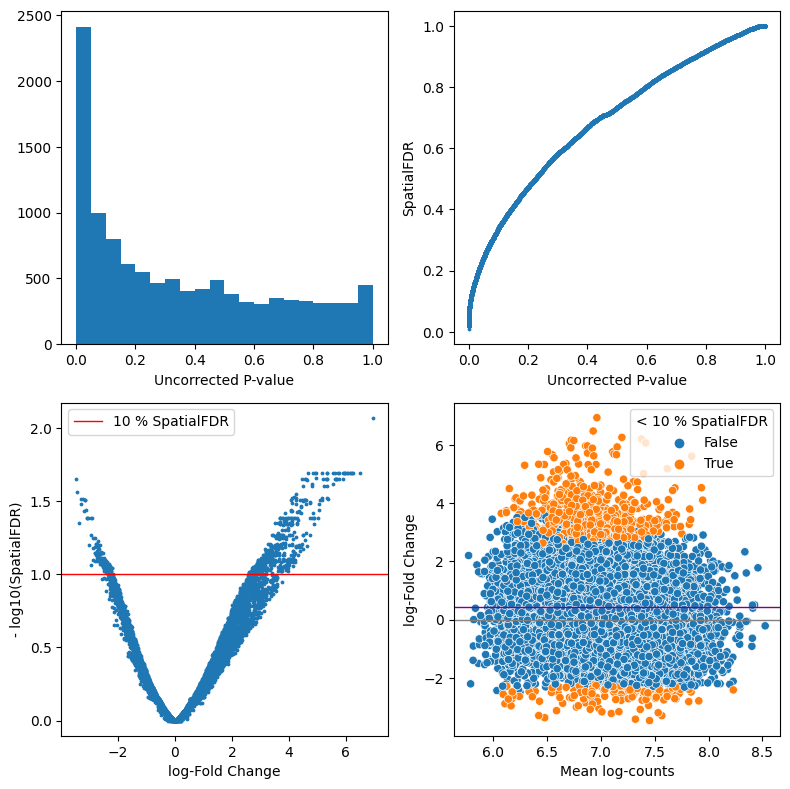

all_RA


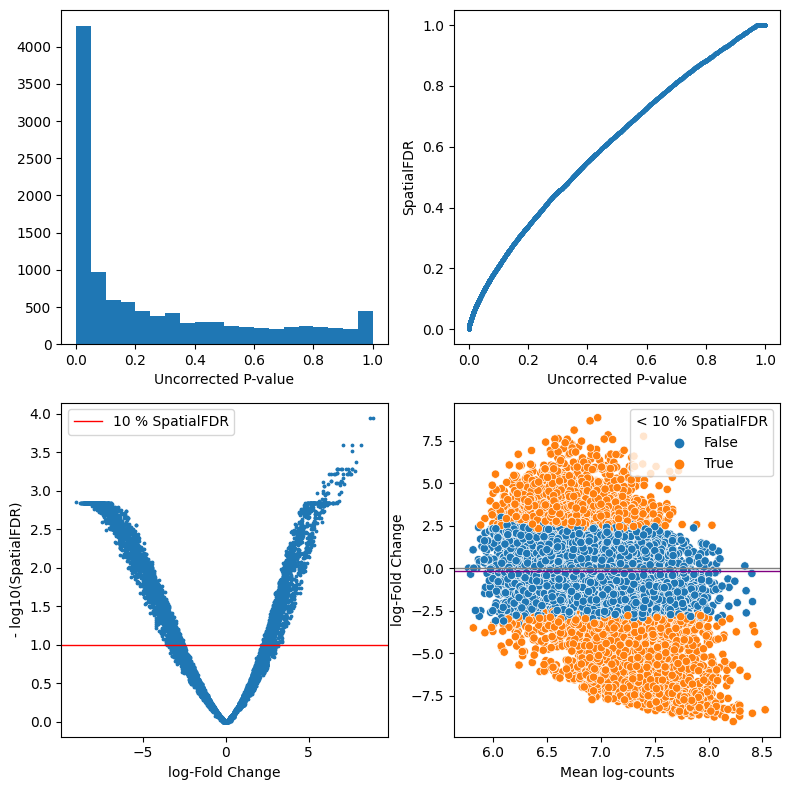

all_Uninfl_CD


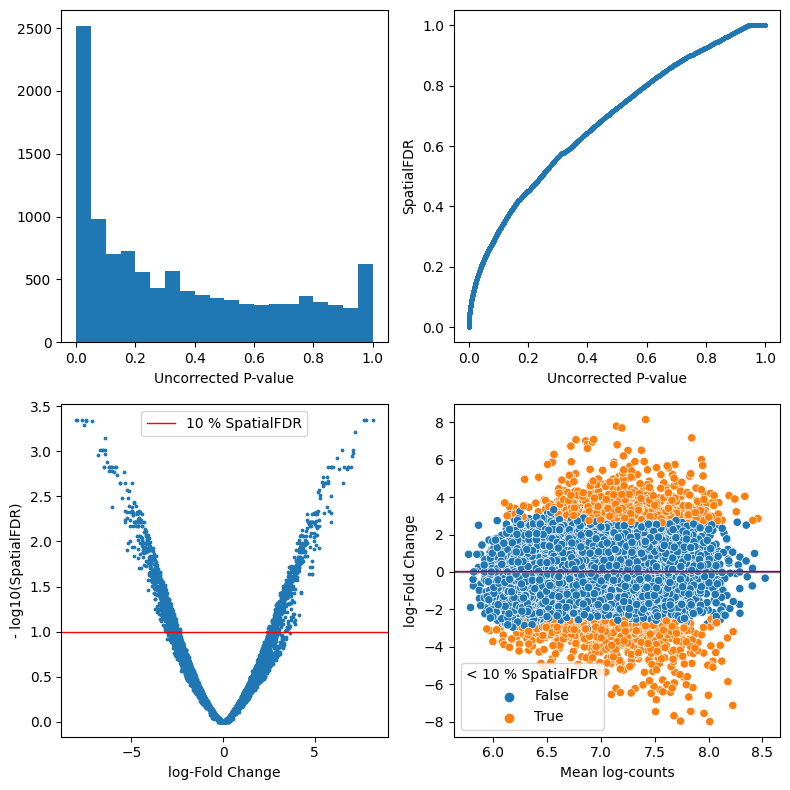

all_Paed_IBD


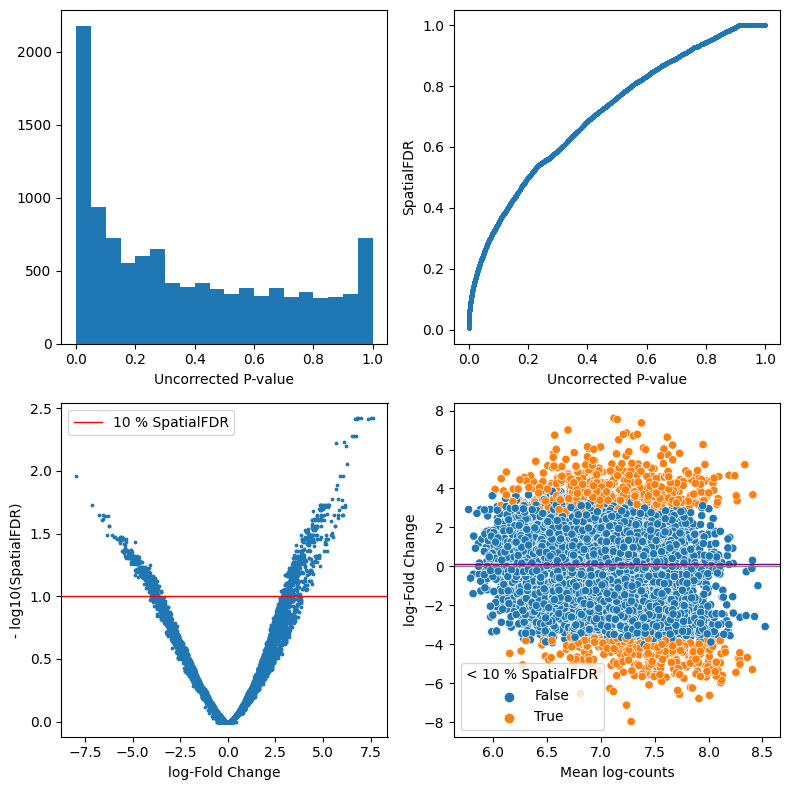

all_pso_arthritis


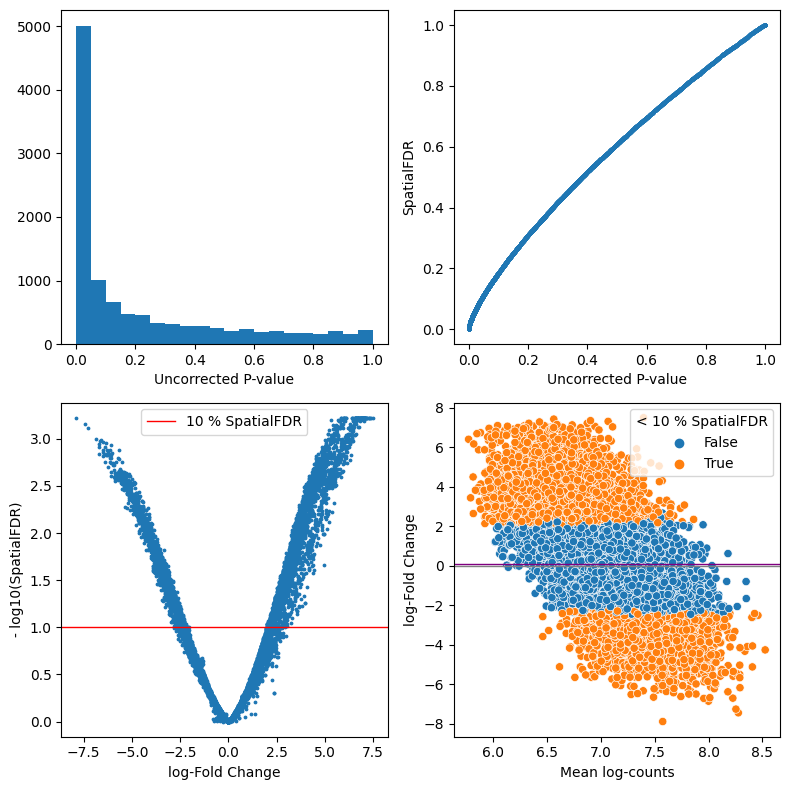

all_hashimoto


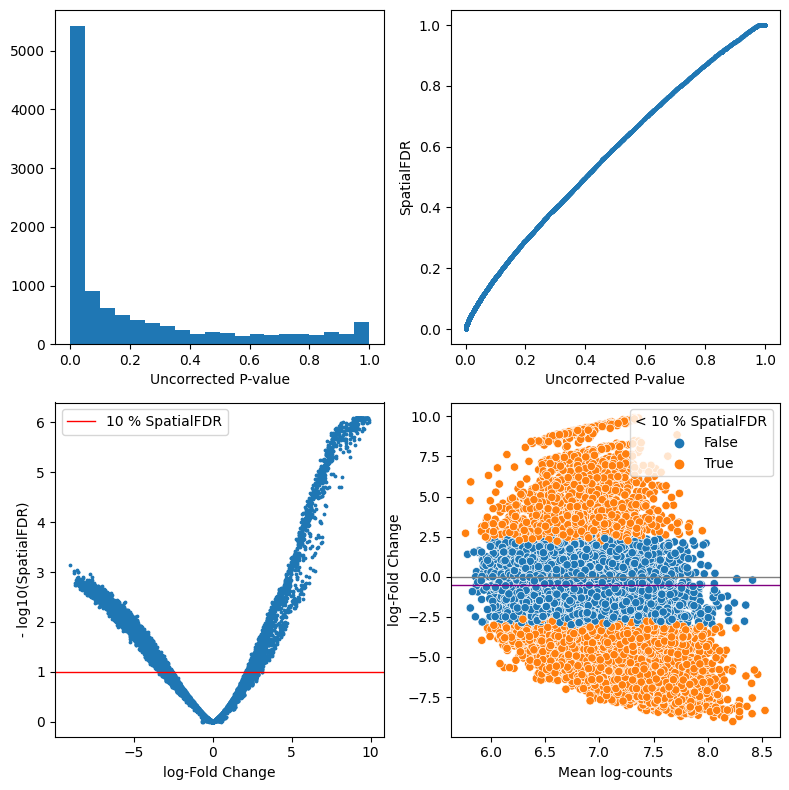

all_Oligo_JIA


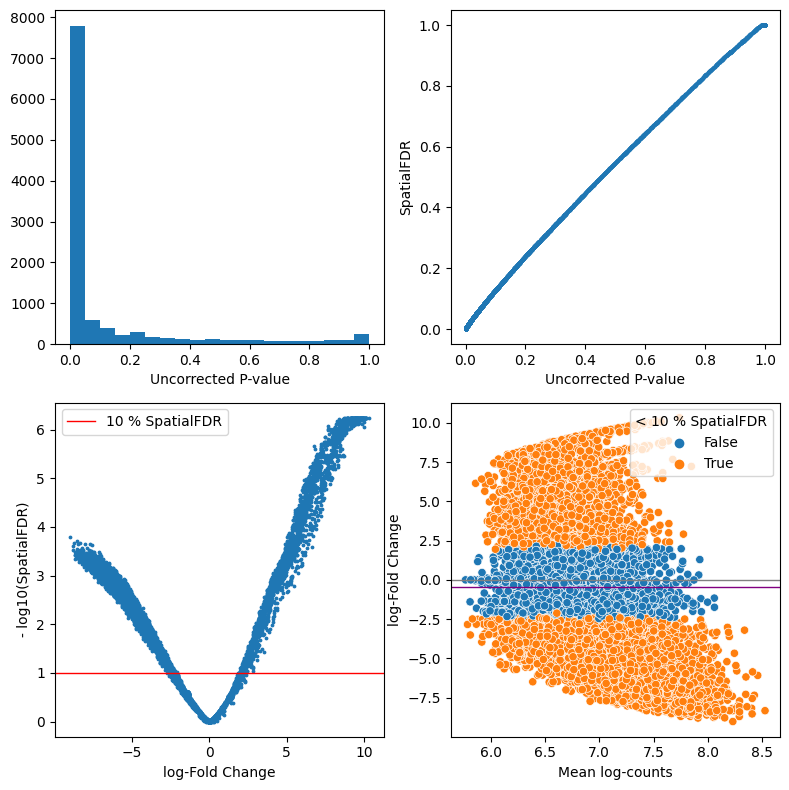

all_CD_and_spondoarthritis


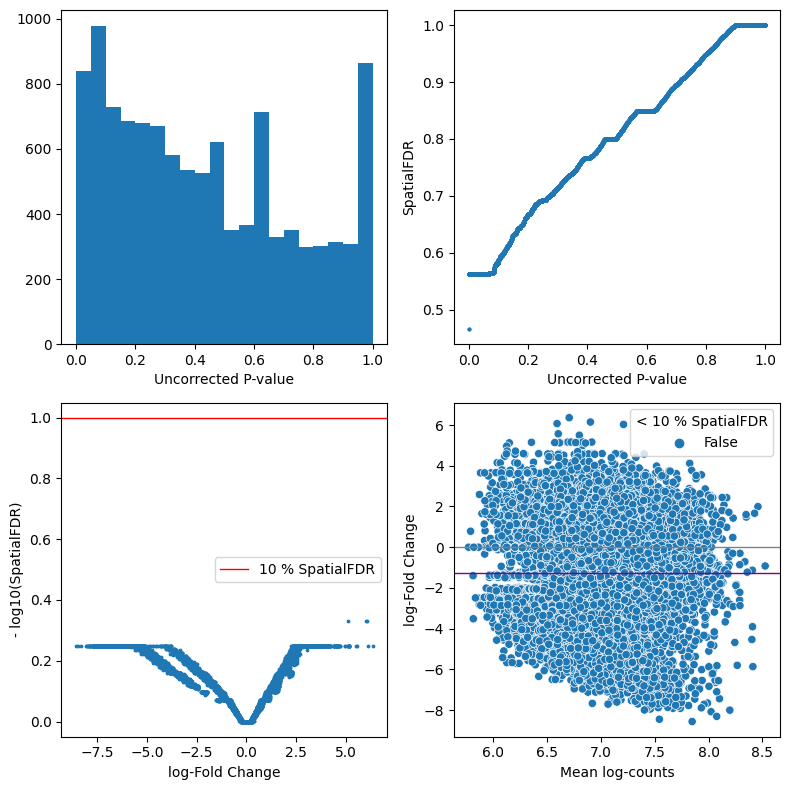

all_spondoarthritis


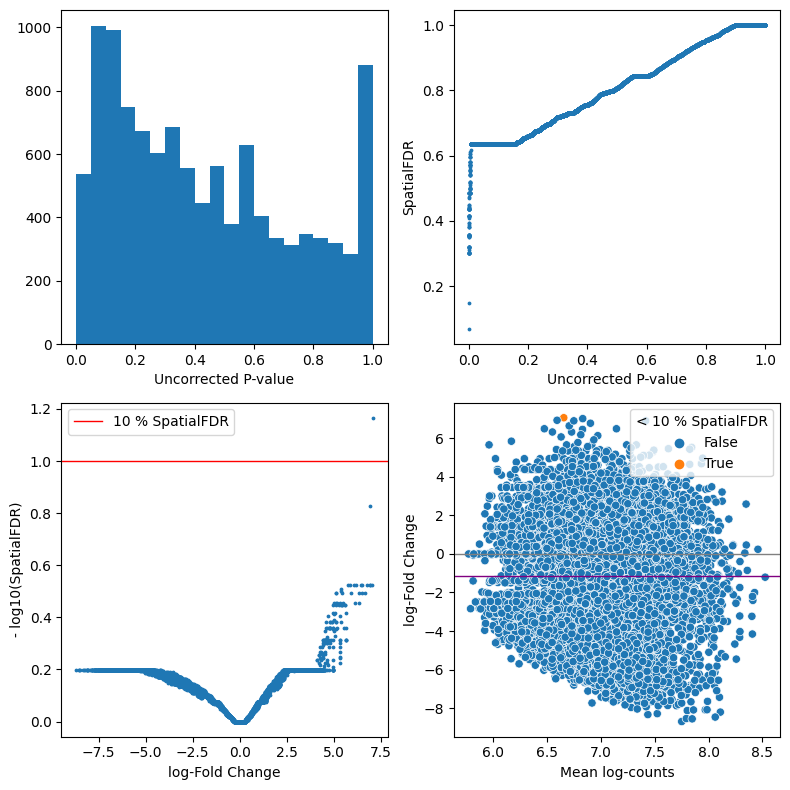

In [27]:
for k in DA_test_res.keys():
    if k.startswith("all_"):
        print(k)
        plot_milo_diagnostics(DA_test_res[k])

Comments:

- In `all_asthma` we see skewed distribution of depleted neighbourhoods (i.e. enriched in Healthy), likely because of the imbalance in number of Healhty and disease donors
- All the others look reasonable in terms of diagnostic statistics, although we might have false positives from batch effects 

## Visualize results by cell type

We select the DA tests where the diagnostic plots look reasonable.

In [28]:
diseases_short

{'Psoriatic arthritis': 'pso_arthritis',
 'Rheumatoid Arthritis': 'RA',
 'Undifferentiated Arthritis': 'Undif_RA',
 'Paediatric IBD': 'Paed_IBD',
 'CD + Spondyloarthritis': 'CD_and_spondoarthritis',
 'Spondyloarhtritis': 'spondoarthritis',
 "Crohn's Disease": 'CD',
 'Healthy': 'Healthy',
 'Uninflamed CD': 'Uninfl_CD',
 'Hashimoto’s thyroiditis': 'hashimoto',
 'Oligoarticular JIA': 'Oligo_JIA'}

In [29]:
keep_tests = ["all_"+val for val in diseases_short.values() if val not in ['Undif_RA', "spondoarthritis", "CD_and_spondoarthritis", "Healthy"]]


In [30]:
keep_tests

['all_pso_arthritis',
 'all_RA',
 'all_Paed_IBD',
 'all_CD',
 'all_Uninfl_CD',
 'all_hashimoto',
 'all_Oligo_JIA']

Visualize DA logFC on gene expression UMAP

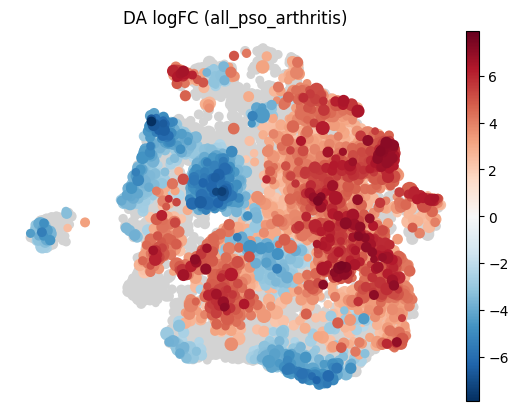

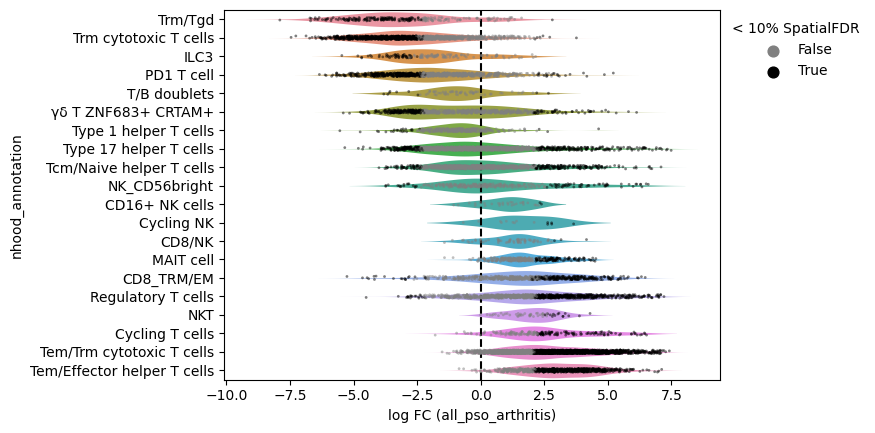

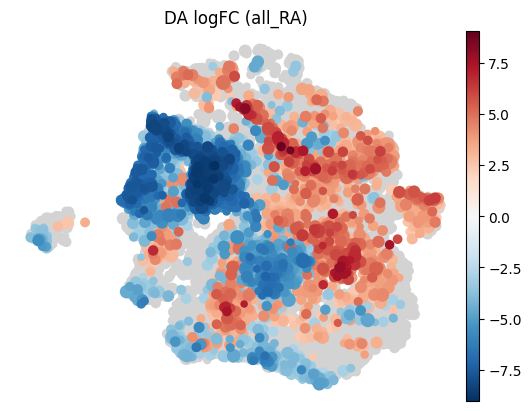

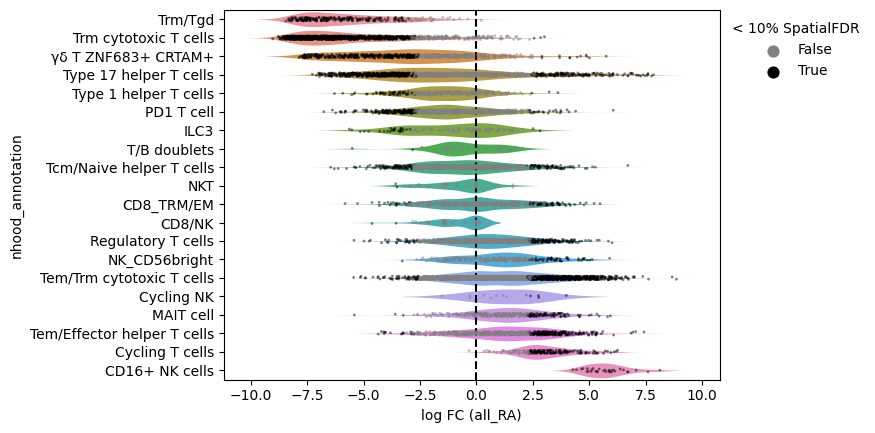

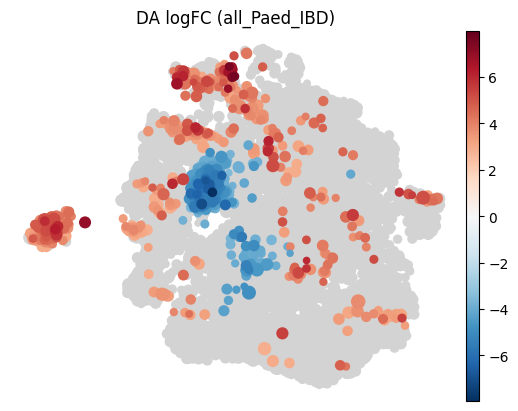

...

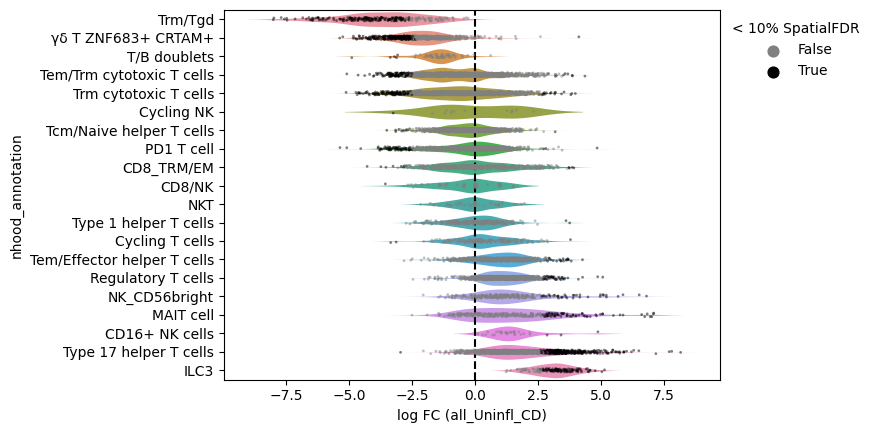

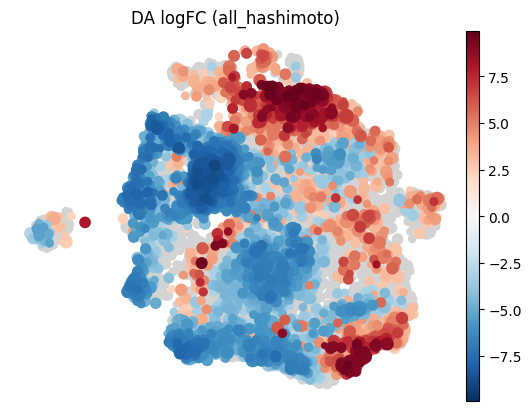

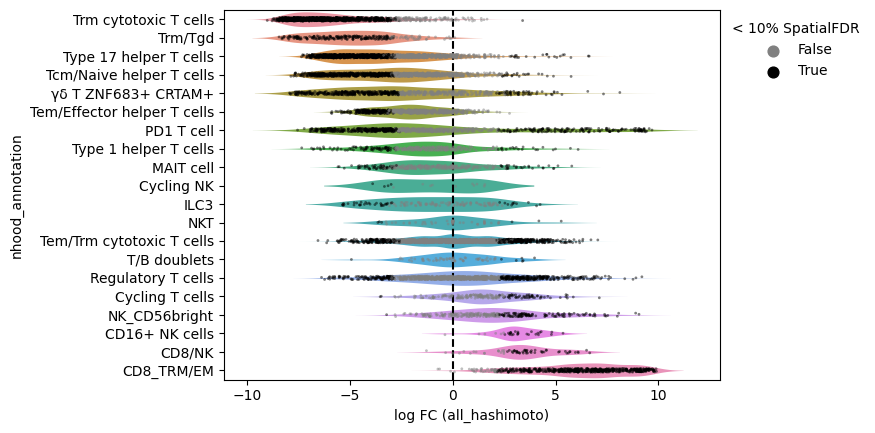

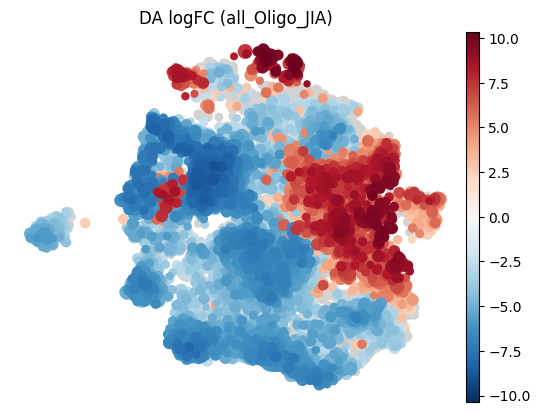

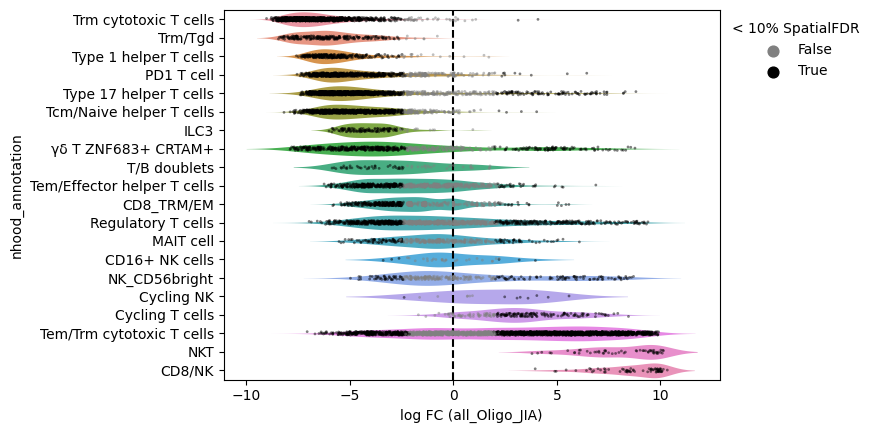

In [31]:
for k in keep_tests:
    #if k == 'all_CD_and_spondoarthritis':
     #   continue
    
    adata.uns['nhood_adata'].obs = DA_test_res[k].copy()

    ## Plot neighbourhoods on embedding
    milopy.utils.build_nhood_graph(adata)
    milopy.plot.plot_nhood_graph(adata, alpha=0.1, min_size=0.5, title=f'DA logFC ({k})');

    ## Plot by cell type
    milopy.utils.annotate_nhoods(adata, anno_col='Cell_type_scANVI')
    milopy.plot.plot_DA_beeswarm(adata, alpha=0.1);
    plt.xlabel(f'log FC ({k})');
    plt.show()

In [32]:
res_cols = ['logFC', 'SpatialFDR', 'Sig', 'index_cell']

In [33]:
disease_df = []
nhood_annotation = np.array(adata.uns["nhood_adata"].obs['nhood_annotation'])
cell_ind = np.array(adata.uns["nhood_adata"].obs['index_cell'])
for disease in keep_tests:
    
    tab = DA_test_res[disease][res_cols]
    #check if index_cell columns are in the same order
    if any(np.array(adata.uns["nhood_adata"].obs['index_cell']) != tab['index_cell']):
        raise Exception("index_cell don't match...")
    tab["disease"] = np.repeat(disease, tab.shape[0])
    tab["nhood_annotation"] = nhood_annotation
    disease_df.append(tab)

In [34]:
adata.uns["nhood_adata"].obs["Sig"].value_counts()

True     8155
False    2887
Name: Sig, dtype: int64

In [35]:
DA_test_res['all_Oligo_JIA']["Sig"].value_counts()

True     8155
False    2887
Name: Sig, dtype: int64

In [36]:
#Check number of neighbourhoods
disease_df[0]['nhood_annotation'].value_counts()

Tem/Trm cytotoxic T cells      2215
Type 17 helper T cells         1325
Trm cytotoxic T cells          1148
Regulatory T cells             1016
Tcm/Naive helper T cells        976
PD1 T cell                      805
Tem/Effector helper T cells     668
γδ T ZNF683+ CRTAM+             619
CD8_TRM/EM                      601
MAIT cell                       307
Type 1 helper T cells           299
NK_CD56bright                   276
Trm/Tgd                         238
Cycling T cells                 184
ILC3                            136
CD8/NK                           66
T/B doublets                     63
NKT                              55
CD16+ NK cells                   31
Cycling NK                       14
Name: nhood_annotation, dtype: int64

In [78]:
compare_disease_df = pd.concat(disease_df)

In [79]:
compare_disease_df.disease.value_counts()

all_pso_arthritis    11042
all_RA               11042
all_Paed_IBD         11042
all_CD               11042
all_Uninfl_CD        11042
all_hashimoto        11042
all_Oligo_JIA        11042
Name: disease, dtype: int64

In [80]:
compare_disease_df

,logFC,SpatialFDR,Sig,index_cell,disease,nhood_annotation
0,1.435388,0.269396,False,ACACCCTCATCGGGTC-1_0_0-0,all_pso_arthritis,Tem/Trm cytotoxic T cells
1,2.679404,0.038046,True,AGCCTAAGTTCTGAAC-1_0_0-0,all_pso_arthritis,Tem/Trm cytotoxic T cells
2,0.853706,0.522061,False,ATGCGATAGATATACG-1_0_0-0,all_pso_arthritis,Tem/Trm cytotoxic T cells
3,1.851386,0.157507,False,ATGTGTGCATCGGTTA-1_0_0-0,all_pso_arthritis,Tem/Trm cytotoxic T cells
4,5.105519,0.009155,True,CAAGGCCAGCCTATGT-1_0_0-0,all_pso_arthritis,CD8_TRM/EM
...,...,...,...,...,...,...
11037,-4.594004,0.007883,True,TCTGGAAAGCAGGTCA-1-1-1-1-1-1-1_1_0_0-1-1,all_Oligo_JIA,Type 17 helper T cells
11038,-5.770384,0.001940,True,TCTTCGGTCAAACGGG-1-1-1-1-1-1-1_1_0_0-1-1,all_Oligo_JIA,Trm cytotoxic T cells
11039,-0.651994,0.739431,False,TTAGGCAAGAATGTTG-1-1-1-1-1-1-1_1_0_0-1-1,all_Oligo_JIA,Type 17 helper T cells
11040,-6.008040,0.001762,True,TTGTAGGAGCAATCTC-1-1-1-1-1-1-1_1_0_0-1-1,all_Oligo_JIA,Type 17 helper T cells


## Save


In [81]:
compare_disease_df.to_csv(h5ad_path+"T_From_Tissue_label_transfer_Milo_3K.csv")

In [37]:
h5ad_path = '/nfs/team205/bh14/Datasets/Remapped/raw_adata/SCVI_Results/All_Tissue_or_Nonimmune/Subset/Milo/'

compare_disease_df = pd.read_csv(h5ad_path+"T_From_Tissue_label_transfer_Milo_3K.csv")

In [82]:
h5ad_path+"T_From_Tissue_label_transfer_Milo_3K.csv"

'/nfs/team205/bh14/Datasets/Remapped/raw_adata/SCVI_Results/All_Tissue_or_Nonimmune/Subset/Milo/T_From_Tissue_label_transfer_Milo_3K.csv'

In [38]:
adata.obs[['Cell_type_scANVI', 'disease_short', 'nhood_ixs_random', 'nhood_ixs_refined', 'nhood_kth_distance']]

,Cell_type_scANVI,disease_short,nhood_ixs_random,nhood_ixs_refined,nhood_kth_distance
AAACCTGCAGGCTCAC-1_0_0-0,Tem/Trm cytotoxic T cells,hashimoto,0,0,0.000000
AAAGATGAGGAATGGA-1_0_0-0,Tem/Effector helper T cells,hashimoto,0,0,0.000000
AAAGATGGTTGTTTGG-1_0_0-0,CD8_TRM/EM,hashimoto,0,0,0.000000
AAAGCAAAGATCTGAA-1_0_0-0,PD1 T cell,hashimoto,0,0,0.000000
AAAGCAAGTCGGCACT-1_0_0-0,Tem/Effector helper T cells,hashimoto,1,0,0.000000
...,...,...,...,...,...
TTTACTGTCATGGTCA-1-1-1-1-1-1-1_1_0_0-1-1,Type 17 helper T cells,CD_and_spondoarthritis,0,1,1.503896
TTTGCGCCATGCCCGA-1-1-1-1-1-1-1_1_0_0-1-1,Type 1 helper T cells,CD_and_spondoarthritis,0,0,0.000000
TTTGCGCGTAAACACA-1-1-1-1-1-1-1_1_0_0-1-1,Type 17 helper T cells,CD_and_spondoarthritis,0,0,0.000000
TTTGGTTCAATCCGAT-1-1-1-1-1-1-1_1_0_0-1-1,PD1 T cell,CD_and_spondoarthritis,0,0,0.000000


In [39]:
gc.collect()

48789

#### Helper functions

In [40]:
def nhoo_test_data(adata, dir_fc, cell_type, nhoo_fc, n_disease, dis_pref="all_", disease_label = "disease_short"):
    '''
    Prepare adata for DE testing in neighbourhoods. Cells in neighbourhoods with significant enrichment or depletion in at least two 
    diseases are selected and subsequently used to subset the anndata object.
    
    Params:
    -------
    - nhoo_fc: long format dataframe containing milo testing results of all diseases
    - disease_set: list of two or more diseases in which neighbourhoods are simultaneously depleted or enriched 
    - cell_type: str or list of cell types to test in
    - dir_fc str indicating the direction of the fold abundance (ie depleted or enriched)
    - cell_type_label label of column containing manually annotated
    
    
    
    '''
    
    #selected_nhoo_df = nhoo_fc[(nhoo_fc.disease.isin(disease_set)) & (nhoo_fc.nhood_annotation.isin(cell_type))]
    selected_nhoo_df = nhoo_fc[nhoo_fc.nhood_annotation.isin(cell_type)]

    selected_nhoo_df.reset_index(drop=True, inplace=True)
    #check depletion
    cond1 = ((selected_nhoo_df.logFC < 0) & (selected_nhoo_df.Sig))
    #check enrichment
    cond2 = ((selected_nhoo_df.logFC > 0) & (selected_nhoo_df.Sig))
    
    selected_nhoo_df["dir_FC"] = np.where(cond1, "Depleted", 
        np.where(cond2, "Enriched", "Non_sig"))

    #check the indicated direction of FC and save to test_nhoo column
    selected_nhoo_df["test_nhoo"] = np.where(selected_nhoo_df.dir_FC==dir_fc.capitalize(), True, False)
    
    print("")
    print(f"shape of selected_nhoo_df: {selected_nhoo_df.shape}")
    #transfrom in wide data frame and conserve only nhoo names(index_cell)
    selected_nhoo_df = pd.pivot(selected_nhoo_df, index=['index_cell'], columns="disease", values="test_nhoo")

    #Identify cells that match the condictions in all diseases
    selected_nhoo_df["selected_nhoo"] = selected_nhoo_df.values.sum(axis=1)
    
    #selected_nhoo_df.selected_nhoo.replace([0,1], ["divergent", "shared"], inplace=True)
    selected_nhoo_df["selected_nhoo"] = np.where(selected_nhoo_df.selected_nhoo >= n_disease,
                                                "shared", "rest")
    
    selected_nhoo_df["selected_nhoo"] = selected_nhoo_df.selected_nhoo.astype('category')
    
    print("selected_nhoo_df")
    print(selected_nhoo_df.shape)
    #subset adata to maintain only cells of interest
    adata0 = adata[adata.obs.Cell_type_scANVI.isin(cell_type)].copy()
    print("adata0")
    print(adata0.shape)
    gc.collect()
    #Index of selected cells
    ind_cel = np.array(np.where(adata.obs.Cell_type_scANVI.isin(cell_type))).flatten()
    
    #Select cells that appear in at least one nhoo
        #Shared
    shared_nhoo = selected_nhoo_df.selected_nhoo[selected_nhoo_df.selected_nhoo == "shared"].index #shared index
    
    ind_shared = np.where(adata.uns["nhood_adata"].obs.index_cell.isin(shared_nhoo))
    
    ind_shared = np.array(ind_shared).flatten()
    
    cells_in_nhoods_sh = adata.obsm["nhoods"][:,ind_shared].toarray().sum(1) > 0

    cells_in_nhoods_sh_2 = adata0.obs_names[cells_in_nhoods_sh[ind_cel]]
    
    adata0.obs["nhoo_test_condition"] = np.where(adata0.obs_names.isin(cells_in_nhoods_sh_2), "shared", "rest")
                                            
    print(adata0.obs["nhoo_test_condition"].value_counts())

    return adata0

In [41]:
from IPython.display import display

We run DEG analysis using MAST in R as recommended by https://www.sc-best-practices.org/conditions/differential_gene_expression.html#notes-on-edger

In [42]:
def prep_anndata(adata_):
    def fix_dtypes(adata_):
        df = pd.DataFrame(adata_.X.A, index=adata_.obs_names, columns=adata_.var_names)
        df = df.join(adata_.obs)
        return sc.AnnData(df[adata_.var_names], obs=df.drop(columns=adata_.var_names))

    adata_ = fix_dtypes(adata_)
    sc.pp.filter_genes(adata_, min_cells=10)
    return adata_

## Milo horizontal plot

In [43]:
h5ad_path = '/nfs/team205/bh14/Datasets/Remapped/raw_adata/SCVI_Results/All_Tissue_or_Nonimmune/Subset/Milo/'

compare_disease_df = pd.read_csv(h5ad_path+"T_From_Tissue_label_transfer_Milo_3K.csv", index_col=0)

In [44]:
compare_disease_df

,logFC,SpatialFDR,Sig,index_cell,disease,nhood_annotation
0,1.435388,0.269396,False,ACACCCTCATCGGGTC-1_0_0-0,all_pso_arthritis,Tem/Trm cytotoxic T cells
1,2.679404,0.038046,True,AGCCTAAGTTCTGAAC-1_0_0-0,all_pso_arthritis,Tem/Trm cytotoxic T cells
2,0.853706,0.522061,False,ATGCGATAGATATACG-1_0_0-0,all_pso_arthritis,Tem/Trm cytotoxic T cells
3,1.851386,0.157507,False,ATGTGTGCATCGGTTA-1_0_0-0,all_pso_arthritis,Tem/Trm cytotoxic T cells
4,5.105519,0.009155,True,CAAGGCCAGCCTATGT-1_0_0-0,all_pso_arthritis,CD8_TRM/EM
...,...,...,...,...,...,...
11037,-4.594004,0.007883,True,TCTGGAAAGCAGGTCA-1-1-1-1-1-1-1_1_0_0-1-1,all_Oligo_JIA,Type 17 helper T cells
11038,-5.770384,0.001940,True,TCTTCGGTCAAACGGG-1-1-1-1-1-1-1_1_0_0-1-1,all_Oligo_JIA,Trm cytotoxic T cells
11039,-0.651994,0.739431,False,TTAGGCAAGAATGTTG-1-1-1-1-1-1-1_1_0_0-1-1,all_Oligo_JIA,Type 17 helper T cells
11040,-6.008040,0.001762,True,TTGTAGGAGCAATCTC-1-1-1-1-1-1-1_1_0_0-1-1,all_Oligo_JIA,Type 17 helper T cells


In [45]:
compare_disease_df.disease.unique()

array(['all_pso_arthritis', 'all_RA', 'all_Paed_IBD', 'all_CD',
       'all_Uninfl_CD', 'all_hashimoto', 'all_Oligo_JIA'], dtype=object)

In [46]:
compare_disease_df.nhood_annotation.unique()

array(['Tem/Trm cytotoxic T cells', 'CD8_TRM/EM', 'Type 1 helper T cells',
       'Regulatory T cells', 'Trm cytotoxic T cells', 'PD1 T cell',
       'NK_CD56bright', 'ILC3', 'γδ T ZNF683+ CRTAM+', 'Cycling T cells',
       'Tcm/Naive helper T cells', 'MAIT cell', 'T/B doublets',
       'Tem/Effector helper T cells', 'CD16+ NK cells',
       'Type 17 helper T cells', 'CD8/NK', 'NKT', 'Cycling NK', 'Trm/Tgd'],
      dtype=object)

In [106]:
l1 = ['Type 1 helper T cells', 'NK_CD56bright', 'ILC3', 'γδ T ZNF683+ CRTAM+', 'Cycling T cells',
       'MAIT cell', 'T/B doublets', 'CD16+ NK cells', 'CD8/NK', 'NKT', 'Cycling NK', 'Trm/Tgd']

In [107]:
l2 = ['Tem/Trm cytotoxic T cells', 'CD8_TRM/EM', 'Type 1 helper T cells',
       'Regulatory T cells', 'Trm cytotoxic T cells', 'PD1 T cell',
       'Tcm/Naive helper T cells', 'Tem/Effector helper T cells']

In [51]:
%%R -i compare_disease_df -w 30 -h 15 --units in -r 600
# Source plotting code
source("/home/jovyan/notebooks_bidossessi/Inflammatory/Remapped/autoimmuneSC/Integrated/R/plot_AIID.R")
#head(compare_disease_df)


l1 = c('Type 1 helper T cells', 'Cycling T cells', 'T/B doublets', 'Tem/Trm cytotoxic T cells', 
       'CD8_TRM/EM', 'Regulatory T cells', 'Trm cytotoxic T cells', 'PD1 T cell',
       'Tcm/Naive helper T cells', 'Tem/Effector helper T cells')

autoimm = c('all_pso_arthritis', 'all_RA', 'all_hashimoto', 'all_Oligo_JIA')

compare_disease_df = compare_disease_df[(compare_disease_df$nhood_annotation %in% l1),]

compare_disease_df$Sig = ifelse(compare_disease_df$Sig == 1, TRUE, FALSE)

#### Prepare data

nhoo_prep = prep_nhoo(nhood_res=compare_disease_df, condition = "disease", Sig = "Sig", thres = 0.1,
                     dis_pref = "all_", index_cell = "index_cell", 
                     nhood_annotation="nhood_annotation", n_shared=0,
                     SpatialFDR = "SpatialFDR", logFC = "logFC")
  

milo_hori_plot = milo_plot_list(nhoo_prep = nhoo_prep, rel_widths = c(1, 0.25),
                                rel_heights = c(3, 2))

milo_hori_plot

In [52]:
%%R -i compare_disease_df -w 30 -h 15 --units in -r 600
# Source plotting code
source("/home/jovyan/notebooks_bidossessi/Inflammatory/Remapped/autoimmuneSC/Integrated/R/plot_AIID.R")
#head(compare_disease_df)

autoimm = c('all_pso_arthritis', 'all_RA', 'all_hashimoto', 'all_Oligo_JIA')

#compare_disease_df = compare_disease_df[(compare_disease_df$disease %in% autoimm),]

    
l2 = c('NK_CD56bright', 'ILC3', 'γδ T ZNF683+ CRTAM+', 'MAIT cell', 
       'CD16+ NK cells', 'CD8/NK', 'NKT', 'Cycling NK', 'Trm/Tgd')

compare_disease_df = compare_disease_df[(compare_disease_df$nhood_annotation %in% l2),]

compare_disease_df$Sig = ifelse(compare_disease_df$Sig == 1, TRUE, FALSE)

#### Prepare data

nhoo_prep = prep_nhoo(nhood_res=compare_disease_df, condition = "disease", Sig = "Sig", thres = 0.1,
                     dis_pref = "all_", index_cell = "index_cell", 
                     nhood_annotation="nhood_annotation", n_shared=0,
                     SpatialFDR = "SpatialFDR", logFC = "logFC")
  

milo_hori_plot = milo_plot_list(nhoo_prep = nhoo_prep, rel_widths = c(1, 0.25),
                                rel_heights = c(3, 2))

milo_hori_plot

## Save prepared data


In [47]:
adata.obs.Cell_type_scANVI.value_counts()

Tem/Trm cytotoxic T cells      23424
Type 17 helper T cells         14052
Trm cytotoxic T cells          12657
Regulatory T cells             12575
Tcm/Naive helper T cells       11276
PD1 T cell                      9220
CD8_TRM/EM                      7681
Tem/Effector helper T cells     7434
γδ T ZNF683+ CRTAM+             7062
MAIT cell                       4283
NK_CD56bright                   4126
Type 1 helper T cells           3847
Trm/Tgd                         3263
ILC3                            2578
Cycling T cells                 2452
T/B doublets                    1085
CD8/NK                           939
Tregs FOXP3-                     826
NKT                              818
CD16+ NK cells                   541
Cycling NK                       501
γδ T KIR2DL4+                    285
Name: Cell_type_scANVI, dtype: int64

In [48]:
#depletion
nhoo_fc=compare_disease_df
n_disease_dict = {
    'PD1 T cell':3,
    'Trm cytotoxic T cells':4,
    'ILC3':4,
    'Trm/Tgd':4,
    'γδ T ZNF683+ CRTAM+':4
}

cell_set = [k for k in n_disease_dict.keys()]

dis_pref="all_"
disease_label = "disease_short"
cell_type_label = "Cell_type_scANVI"
dir_fc = "depleted"
compare_with = True
depl_adatas = []

for cel in cell_set:
    print(f"\n processing {cel}...\n")
    
    test_adata_ = nhoo_test_data(adata=adata, dir_fc = dir_fc, cell_type=[cel], dis_pref="all_", 
                                disease_label = "disease_short", nhoo_fc=compare_disease_df,
                                n_disease = n_disease_dict[cel])

    if(len(test_adata_.obs.nhoo_test_condition.unique()) == 1):
        print(f"Check Category of removed data: {test_adata_.obs.nhoo_test_condition.unique()}")
        continue
    
    print("n_disease")
    print(test_adata_.obs.disease_short.value_counts())
    
    gc.collect()
    depl_adatas.append(test_adata_)
    
    del test_adata_

depleted_adata = depl_adatas[0].concatenate(depl_adatas[1:])


 processing PD1 T cell...


shape of selected_nhoo_df: (5635, 8)
selected_nhoo_df
(805, 8)
adata0
(9220, 18033)
shared    7993
rest      1227
Name: nhoo_test_condition, dtype: int64
n_disease
CD                        3121
hashimoto                 1843
Paed_IBD                  1623
Uninfl_CD                  894
Healthy                    734
pso_arthritis              646
RA                         264
CD_and_spondoarthritis      43
spondoarthritis             32
Oligo_JIA                   20
Name: disease_short, dtype: int64

 processing Trm cytotoxic T cells...


shape of selected_nhoo_df: (8036, 8)
selected_nhoo_df
(1148, 8)
adata0
(12657, 18033)
shared    12301
rest        356
Name: nhoo_test_condition, dtype: int64
n_disease
CD                        4078
pso_arthritis             2472
Uninfl_CD                 2420
Healthy                   1985
Paed_IBD                   840
spondoarthritis            496
CD_and_spondoarthritis     200
RA                          99
hashimo

In [53]:
depleted_adata

AnnData object with n_obs × n_vars = 34780 × 18033
    obs: 'tissue', 'disease', 'donor_id', 'dataset_id', 'cell_source', 'doublet_scores', 'predicted_doublets', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'QC', 'sex', 'development_stage', 'batch', 'orig.ident', 'n_genes', 'leiden_1_5', 'predicted_labels', 'majority_voting', 'conf_score', '_scvi_batch', 'cell_type', '_scvi_labels', 'barcodes', 'disease_status', 'age', 'developmental_stage', 'barcode', 'sample_id', 'Site', 'Enrichment', 'Location', 'full_clustering', 'log1p_total_counts', 'author_annotation', 'leiden_man', 'leiden_R', 'cell_type2', 'majority_voting_2', 'leiden', 'Cell_type_scANVI', 'disease_short', 'nhood_ixs_random', 'nhood_ixs_refined', 'nhood_kth_distance', 'nhoo_test_condition'
    var: 'mt-0', 'rb-0', 'n_cells_by_counts-0-0-0', 'mean_counts-0-0-0', 'pct_dropout_by_counts-0-0-0', 'total_counts-0-0-0', 'n_cells_by_counts-1-0-0', 'mean_counts-1-0-0', 'pc

In [54]:
depleted_adata.obs.Cell_type_scANVI.unique()

array(['PD1 T cell', 'Trm cytotoxic T cells', 'ILC3', 'Trm/Tgd',
       'γδ T ZNF683+ CRTAM+'], dtype=object)

In [55]:
depleted_adata.write_h5ad(h5ad_path+"depleted_nhoo/Tissue_T_depleted_Milo_adata.h5ad")

In [56]:
del depleted_adata

In [57]:
del depl_adatas

#### Enriched

In [112]:
%%R -i compare_disease_df -w 30 -h 15 --units in -r 600
# Source plotting code
source("/home/jovyan/notebooks_bidossessi/Inflammatory/Remapped/autoimmuneSC/Integrated/R/plot_AIID.R")
#head(compare_disease_df)


l1 = c('Type 1 helper T cells', 'Cycling T cells', 'T/B doublets', 'Tem/Trm cytotoxic T cells', 
       'CD8_TRM/EM', 'Regulatory T cells', 'Trm cytotoxic T cells', 'PD1 T cell',
       'Tcm/Naive helper T cells', 'Tem/Effector helper T cells')

autoimm = c('all_pso_arthritis', 'all_RA', 'all_hashimoto', 'all_Oligo_JIA')

compare_disease_df = compare_disease_df[(compare_disease_df$nhood_annotation %in% l1),]

compare_disease_df$Sig = ifelse(compare_disease_df$Sig == 1, TRUE, FALSE)

#### Prepare data

nhoo_prep = prep_nhoo(nhood_res=compare_disease_df, condition = "disease", Sig = "Sig", thres = 0.1,
                     dis_pref = "all_", index_cell = "index_cell", 
                     nhood_annotation="nhood_annotation", n_shared=0,
                     SpatialFDR = "SpatialFDR", logFC = "logFC")
  

milo_hori_plot = milo_plot_list(nhoo_prep = nhoo_prep, rel_widths = c(1, 0.25),
                                rel_heights = c(3, 2))

milo_hori_plot

In [113]:
%%R -i compare_disease_df -w 30 -h 15 --units in -r 600
# Source plotting code
source("/home/jovyan/notebooks_bidossessi/Inflammatory/Remapped/autoimmuneSC/Integrated/R/plot_AIID.R")
#head(compare_disease_df)

autoimm = c('all_pso_arthritis', 'all_RA', 'all_hashimoto', 'all_Oligo_JIA')

#compare_disease_df = compare_disease_df[(compare_disease_df$disease %in% autoimm),]

    
l2 = c('NK_CD56bright', 'ILC3', 'γδ T ZNF683+ CRTAM+', 'MAIT cell', 
       'CD16+ NK cells', 'CD8/NK', 'NKT', 'Cycling NK', 'Trm/Tgd')

compare_disease_df = compare_disease_df[(compare_disease_df$nhood_annotation %in% l2),]

compare_disease_df$Sig = ifelse(compare_disease_df$Sig == 1, TRUE, FALSE)

#### Prepare data

nhoo_prep = prep_nhoo(nhood_res=compare_disease_df, condition = "disease", Sig = "Sig", thres = 0.1,
                     dis_pref = "all_", index_cell = "index_cell", 
                     nhood_annotation="nhood_annotation", n_shared=0,
                     SpatialFDR = "SpatialFDR", logFC = "logFC")
  

milo_hori_plot = milo_plot_list(nhoo_prep = nhoo_prep, rel_widths = c(1, 0.25),
                                rel_heights = c(3, 2))

milo_hori_plot

In [120]:
adata.obs.Cell_type_scANVI.value_counts()

Tem/Trm cytotoxic T cells      23424
Type 17 helper T cells         14052
Trm cytotoxic T cells          12657
Regulatory T cells             12575
Tcm/Naive helper T cells       11276
PD1 T cell                      9220
CD8_TRM/EM                      7681
Tem/Effector helper T cells     7434
γδ T ZNF683+ CRTAM+             7062
MAIT cell                       4283
NK_CD56bright                   4126
Type 1 helper T cells           3847
Trm/Tgd                         3263
ILC3                            2578
Cycling T cells                 2452
T/B doublets                    1085
CD8/NK                           939
Tregs FOXP3-                     826
NKT                              818
CD16+ NK cells                   541
Cycling NK                       501
γδ T KIR2DL4+                    285
Name: Cell_type_scANVI, dtype: int64

In [121]:
#Enrichment
gc.collect()

nhoo_fc=compare_disease_df
n_disease_dict = {
    'Tem/Trm cytotoxic T cells':4,#
    'Regulatory T cells':4,#
    'MAIT cell':4,#
    'NK_CD56bright':4,#
    'Cycling T cells':5
}

cell_set = [k for k in n_disease_dict.keys()]

dis_pref="all_"
disease_label = "disease_short"
cell_type_label = "Cell_type_scANVI"
dir_fc = "enriched"
compare_with = True
enriched_adatas = []

for cel in cell_set:

    cell_type = [cel]
    print(f"\n processing {cel}...\n")

    test_adata = nhoo_test_data(adata=adata, dir_fc = dir_fc, cell_type=cell_type, 
                                dis_pref="all_", disease_label = "disease_short", 
                                nhoo_fc=compare_disease_df, n_disease=n_disease_dict[cel])

    if(len(test_adata.obs.nhoo_test_condition.unique()) == 1):
        print(f"Check Category of removed data: {test_adata.obs.nhoo_test_condition.unique()}")
        continue
    
    print("n_disease")
    print(test_adata.obs.disease_short.value_counts())
    
    enriched_adatas.append(test_adata)

enriched_adata = enriched_adatas[0].concatenate(enriched_adatas[1:])


 processing Tem/Trm cytotoxic T cells...


shape of selected_nhoo_df: (15505, 8)
selected_nhoo_df
(2215, 8)
adata0
(23424, 18033)
shared    12389
rest      11035
Name: nhoo_test_condition, dtype: int64
n_disease
pso_arthritis             10669
Oligo_JIA                  8024
CD                         1637
RA                          963
Paed_IBD                    691
Healthy                     497
hashimoto                   489
Uninfl_CD                   348
spondoarthritis              78
CD_and_spondoarthritis       28
Name: disease_short, dtype: int64

 processing Regulatory T cells...


shape of selected_nhoo_df: (7112, 8)
selected_nhoo_df
(1016, 8)
adata0
(12575, 18033)
shared    7750
rest      4825
Name: nhoo_test_condition, dtype: int64
n_disease
pso_arthritis             4913
CD                        3334
Oligo_JIA                 1031
hashimoto                  941
Uninfl_CD                  904
Paed_IBD                   848
Healthy                    288
RA           

In [123]:
enriched_adata

AnnData object with n_obs × n_vars = 46860 × 18033
    obs: 'tissue', 'disease', 'donor_id', 'dataset_id', 'cell_source', 'doublet_scores', 'predicted_doublets', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'QC', 'sex', 'development_stage', 'batch', 'orig.ident', 'n_genes', 'leiden_1_5', 'predicted_labels', 'majority_voting', 'conf_score', '_scvi_batch', 'cell_type', '_scvi_labels', 'barcodes', 'disease_status', 'age', 'developmental_stage', 'barcode', 'sample_id', 'Site', 'Enrichment', 'Location', 'full_clustering', 'log1p_total_counts', 'author_annotation', 'leiden_man', 'leiden_R', 'cell_type2', 'majority_voting_2', 'leiden', 'Cell_type_scANVI', 'disease_short', 'nhood_ixs_random', 'nhood_ixs_refined', 'nhood_kth_distance', 'nhoo_test_condition'
    var: 'mt-0', 'rb-0', 'n_cells_by_counts-0-0-0', 'mean_counts-0-0-0', 'pct_dropout_by_counts-0-0-0', 'total_counts-0-0-0', 'n_cells_by_counts-1-0-0', 'mean_counts-1-0-0', 'pc

In [124]:
enriched_adata.write_h5ad(h5ad_path+"enriched_nhoo/Tissue_T_enriched_Milo_adata.h5ad")

In [125]:
del enriched_adata

In [126]:
del test_adata
del enriched_adatas
gc.collect()

1722